In [170]:
import numpy as np
import matplotlib.pyplot as plt
import ultranest
import read_beam_FEKO as rf
from ultranest.plot import cornerplot
import scipy.interpolate
import scipy.optimize

In [229]:
o = rf.read_beam_FEKO('nominal.out',0)

 Frequency in Hz:               FREQ =    2.50000E+07

 Frequency in Hz:               FREQ =    2.60000E+07

 Frequency in Hz:               FREQ =    2.70000E+07

 Frequency in Hz:               FREQ =    2.80000E+07

 Frequency in Hz:               FREQ =    2.90000E+07

 Frequency in Hz:               FREQ =    3.00000E+07

 Frequency in Hz:               FREQ =    3.10000E+07

 Frequency in Hz:               FREQ =    3.20000E+07

 Frequency in Hz:               FREQ =    3.30000E+07

 Frequency in Hz:               FREQ =    3.40000E+07

 Frequency in Hz:               FREQ =    3.50000E+07

 Frequency in Hz:               FREQ =    3.60000E+07

 Frequency in Hz:               FREQ =    3.70000E+07

 Frequency in Hz:               FREQ =    3.80000E+07

 Frequency in Hz:               FREQ =    3.90000E+07

 Frequency in Hz:               FREQ =    4.00000E+07

 Frequency in Hz:               FREQ =    4.10000E+07

 Frequency in Hz:               FREQ =    4.20000E+07

 Frequency

In [230]:
theta = 90 - o[2]
phi = o[1]
freq = o[0]
gain = o[5]
theta, phi = np.meshgrid(theta, phi)

In [231]:
sigma = 0.6613*180/np.pi
#make sigma a input parameter
def Acos(R, theta, miu, nu):
    part1 = np.cos(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def Asin(R, theta, miu, nu):
    part1 = np.sin(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def P(miu,nu,u):
    terms = []
    p = 0
    while p <= nu:
        up = np.math.factorial(miu + nu)*np.math.factorial(nu)
        down = np.math.factorial(miu + p)*np.math.factorial(p)*np.math.factorial(nu-p)
        term = (-2)**(nu-p)* up/down * u[i][j]**p
        terms.append(term)
        p += 1
    print(terms)
    
def P(miu,nu,u):
    terms = []
    p = 0
    while p <= nu:
        up = np.math.factorial(miu + nu)*np.math.factorial(nu)
        down = np.math.factorial(miu + p)*np.math.factorial(p)*np.math.factorial(nu-p)
        term = (-2)**(nu-p)* up/down * u**p
        terms.append(term)
        p += 1
    terms = np.array(terms)
    return np.sum(terms,axis = 0)

#Normalization
def normalize(array):
    q = 0
    theta = 0
    while theta <= 90:
        for i in range(360):
            q += (array[theta*360 + i])**2 * (np.pi/180)**2 * np.sin(theta*np.pi/180)
        theta += 1
    return array/q

def TDH(rank):
    """return matrix A = [f1, f2, f3, ...] for rank 0 to rank TDH functions"""
    zz00c = Acos(xx, yy, 0, 0)
    zz00c2d = zz00c.flatten()
    array = normalize(zz00c2d)
    r = 1
    while r <= rank:
        m = 0
        while m <= r:
            if (r - m)%2 == 0:
                n = (r - m)/2
                if m == 0:
                    cosine = Acos(xx,yy,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    array = np.vstack((array, ncos))
                    m += 2
                else:
                    cosine = Acos(xx,yy,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    sine = Asin(xx,yy,m,n)
                    sine2d = sine.flatten()
                    nsin = normalize(sine2d)
                    array = np.vstack((array, ncos))
                    array = np.vstack((array, nsin))
                    m += 2
            else:
                m += 1
        r += 1
    matrix = np.matrix(array).T
    return matrix

def model(rank, coe):
    A = TDH(rank)
    a = np.matrix(coe).T
    return np.matmul(A,a)

def simulation(coe, sigma):
    rank = 0
    count = 1
    length = len(coe) - 1
    while length > count:
        rank += 1
        count += rank + 1
    mo = model(rank,coe)
    noise = np.random.default_rng().normal(0.0, sigma*np.max(mo),360*91)
    noi = np.matrix(noise).T
    data = mo + noi
    return data

def solve(A, data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    half = np.matmul(ATAinverse,AT)
    x = np.matmul(half,data)
    return x

def residual(A,data):
    x = solve(A, data)
    AT = A.T
    fittingmodel = np.matmul(A, x)
    r = data - fittingmodel
    return r

def residual2D(A,data):
    r = residual(A,data)
    r2D = r.reshape(360,91)
    return r2D

def covariance(A,data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    r = residual(A,data)
    rT = r.T
    rTr = np.matmul(rT,r)
    s = rTr/((len(data))-10)
    s2 = s.item(0)
    covariance = s2*ATAinverse
    return covariance

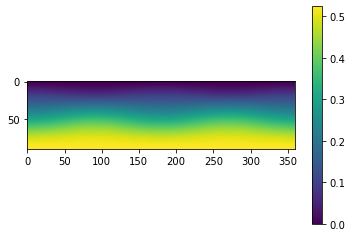

In [66]:
plt.imshow(gain[0])
plt.colorbar()

In [101]:
first = gain[0].T[0]
last = gain[0].T[90]

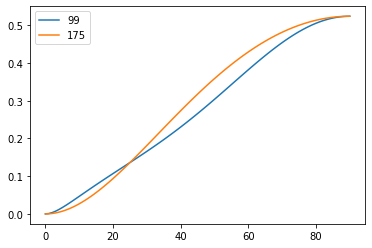

In [102]:
plt.plot(first, label = "99")
plt.plot(last, label = "175")
plt.legend()

In [103]:
scipy.interpolate.CubicSpline?

In [104]:
x = np.flip(theta[0])

In [105]:
x

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
       39., 40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50., 51.,
       52., 53., 54., 55., 56., 57., 58., 59., 60., 61., 62., 63., 64.,
       65., 66., 67., 68., 69., 70., 71., 72., 73., 74., 75., 76., 77.,
       78., 79., 80., 81., 82., 83., 84., 85., 86., 87., 88., 89., 90.])

In [106]:
interpo1 = scipy.interpolate.CubicSpline(x,np.flip(first))
interpo2 = scipy.interpolate.CubicSpline(x,np.flip(last))

In [107]:
xnew = np.linspace(0,90,90000)

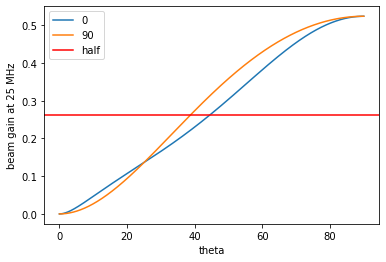

In [115]:
inter1 = np.flip(interpo1(xnew))
inter2 = np.flip(interpo2(xnew))
plt.plot(xnew,inter1,label = "0")
plt.plot(xnew,inter2,label = "90")
plt.axhline(y = np.max(gain[0]/2), color='r', linestyle='-', label = "half")
plt.xlabel("theta")
plt.ylabel("beam gain at 25 MHz")
plt.legend()

In [109]:
inter1[90000//2],inter2[90000//2]

(0.265867968121558, 0.3173845914110715)

In [110]:
ratio = inter2[90000//2]/inter1[90000//2]

In [111]:
ratiog = 0.7030/0.6612

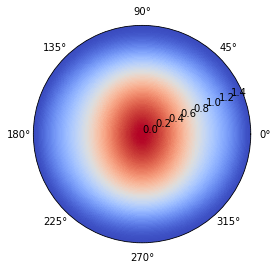

In [61]:
fig, axs = plt.subplots(1, 1, subplot_kw=dict(projection="polar"))
axs.pcolormesh(phi*np.pi/180,theta*np.pi/180,gain[0].T.reshape(360,91),cmap='coolwarm',shading='auto')

In [394]:
inter1[42817]

0.49999989153229646

In [395]:
inter2[75086]

0.4999985112361328

In [144]:
ratio = 43.817/37.426

In [145]:
ratio, ratiog

(1.1707636402500934, 1.0632183908045976)

In [272]:
phi

array([[  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  1.,   1.,   1., ...,   1.,   1.,   1.],
       [  2.,   2.,   2., ...,   2.,   2.,   2.],
       ...,
       [357., 357., 357., ..., 357., 357., 357.],
       [358., 358., 358., ..., 358., 358., 358.],
       [359., 359., 359., ..., 359., 359., 359.]])

<ipython-input-148-11eb70e73326>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 1, subplot_kw=dict(projection="polar"))


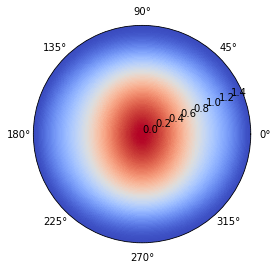

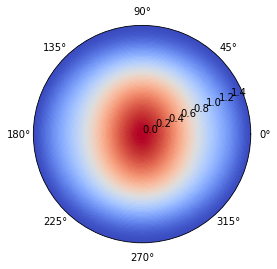

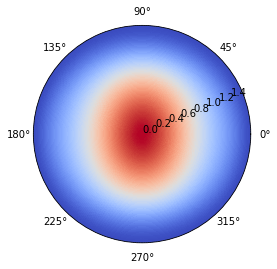

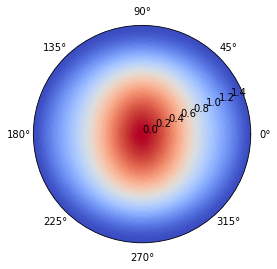

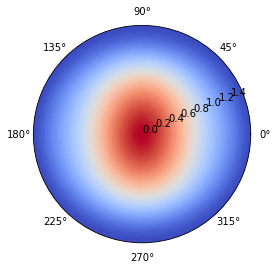

...

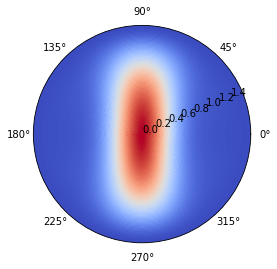

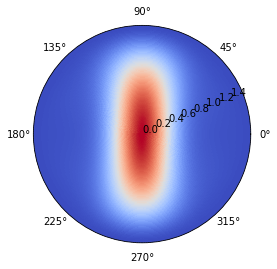

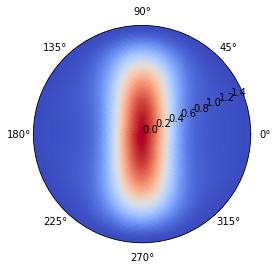

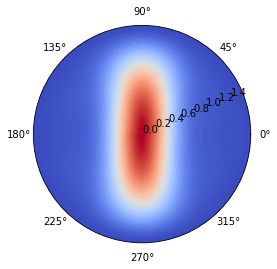

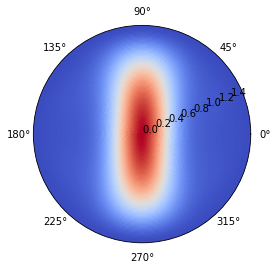

In [148]:
for i in range(len(gain)):
    fig, axs = plt.subplots(1, 1, subplot_kw=dict(projection="polar"))
    axs.pcolormesh(phi*np.pi/180,theta*np.pi/180,gain[i].T.reshape(360,91),cmap='coolwarm',shading='auto')

In [164]:
xx = theta
yy = phi
yy = yy*ratio

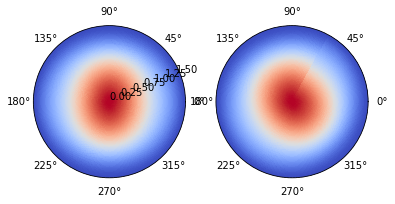

In [168]:
fig, axs = plt.subplots(1, 2, subplot_kw=dict(projection="polar"),sharex='all', sharey='all')
axs[0].pcolormesh(phi*np.pi/180,theta*np.pi/180,gain[0].T.reshape(360,91),cmap='coolwarm',shading='auto')
axs[1].pcolormesh(yy*np.pi/180,xx*np.pi/180,gain[0].T.reshape(360,91),cmap='coolwarm',shading='auto')

In [167]:
yy.T[0]

array([  0.        ,   1.17076364,   2.34152728,   3.51229092,
         4.68305456,   5.8538182 ,   7.02458184,   8.19534548,
         9.36610912,  10.53687276,  11.7076364 ,  12.87840004,
        14.04916368,  15.21992732,  16.39069096,  17.5614546 ,
        18.73221824,  19.90298188,  21.07374552,  22.24450916,
        23.41527281,  24.58603645,  25.75680009,  26.92756373,
        28.09832737,  29.26909101,  30.43985465,  31.61061829,
        32.78138193,  33.95214557,  35.12290921,  36.29367285,
        37.46443649,  38.63520013,  39.80596377,  40.97672741,
        42.14749105,  43.31825469,  44.48901833,  45.65978197,
        46.83054561,  48.00130925,  49.17207289,  50.34283653,
        51.51360017,  52.68436381,  53.85512745,  55.02589109,
        56.19665473,  57.36741837,  58.53818201,  59.70894565,
        60.87970929,  62.05047293,  63.22123657,  64.39200021,
        65.56276385,  66.73352749,  67.90429113,  69.07505477,
        70.24581842,  71.41658206,  72.5873457 ,  73.75

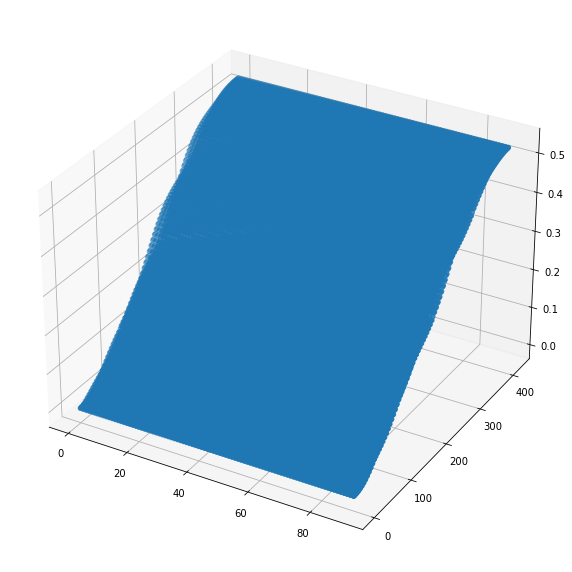

Text(0.09323812187683778, 0.01249153973034657, 'Z Label')

In [210]:
fig = plt.figure(figsize = (10,20))
ax = fig.add_subplot(projection='3d')
ax.scatter3D(xx,yy,gain[0])
plt.show()
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

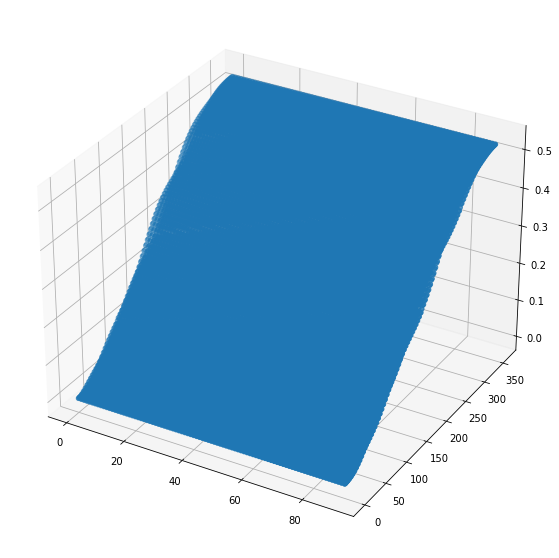

Text(0.09359279965720162, 0.012539057542757446, 'Z Label')

In [211]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(projection='3d')
ax.scatter3D(theta,phi,gain[0])
plt.show()
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

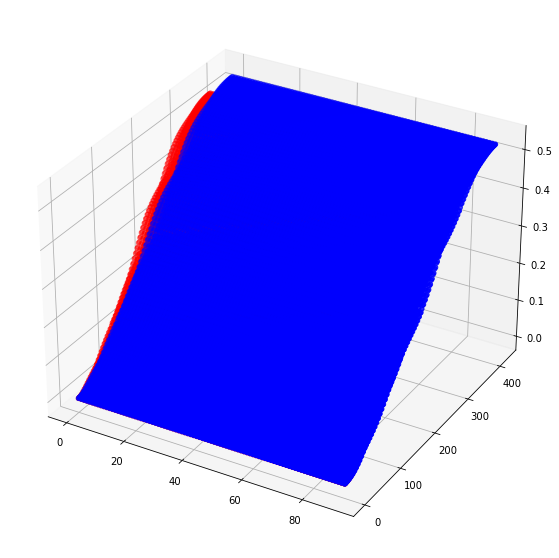

Text(0.0935927996572016, 0.012539057542757446, 'Z Label')

In [213]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(projection='3d')
ax.scatter3D(theta,phi,gain[0], color = 'r')
ax.scatter3D(xx,yy,gain[0],color = 'b')
plt.show()
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

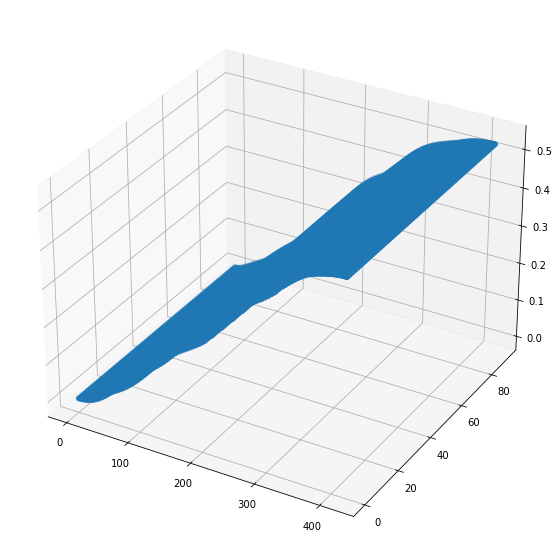

Text(0.0935927996572016, 0.012539057542757434, 'Z Label')

In [202]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(projection='3d')
ax.scatter3D(yy,xx,gain[0])
plt.show()
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

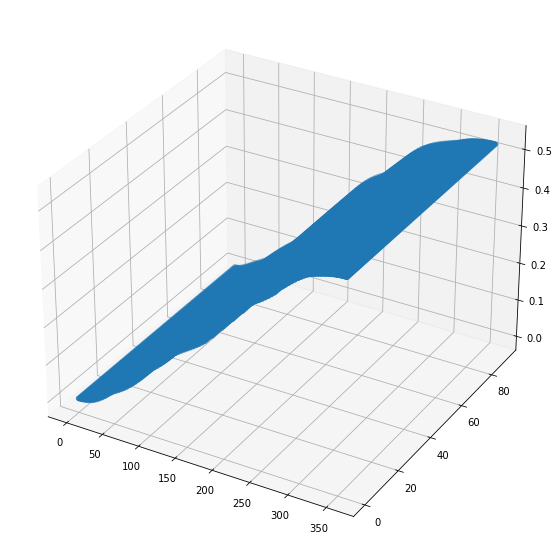

Text(0.0935927996572016, 0.012539057542757429, 'Z Label')

In [201]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(projection='3d')
ax.scatter3D(phi,theta,gain[0])
plt.show()
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

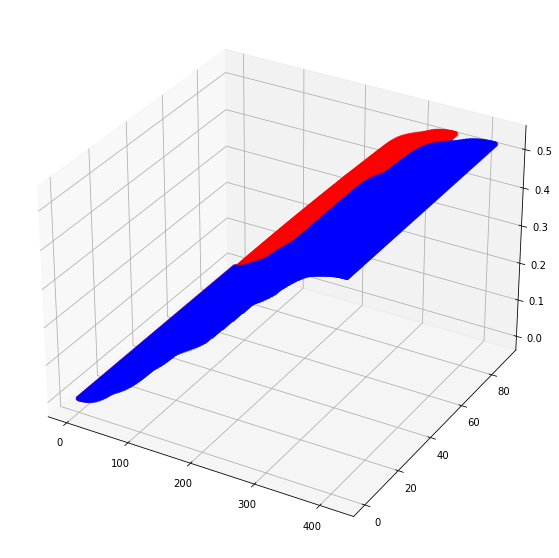

Text(0.0935927996572016, 0.012539057542757434, 'Z Label')

In [214]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(projection='3d')
ax.scatter3D(phi,theta,gain[0], color = 'r')
ax.scatter3D(yy,xx,gain[0],color = 'b')
plt.show()
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

In [237]:
x = np.sin(theta)*np.cos(phi)
y = np.sin(theta)*np.sin(phi)

<IPython.core.display.Javascript object>


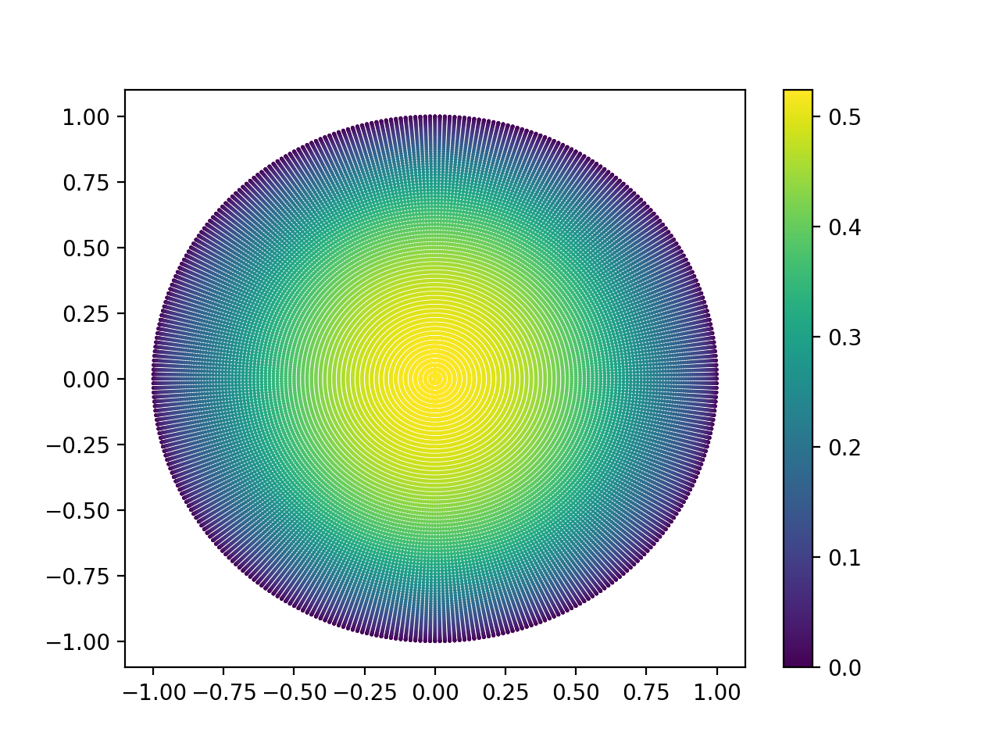

In [384]:
%matplotlib notebook
x = np.cos(phi*np.pi/180)*np.sin(theta*np.pi/180)
y = np.sin(phi*np.pi/180)*np.sin(theta*np.pi/180)
sc = plt.scatter(x,y,c = gain[0].T,s = 0.5)
plt.colorbar(sc)

<IPython.core.display.Javascript object>


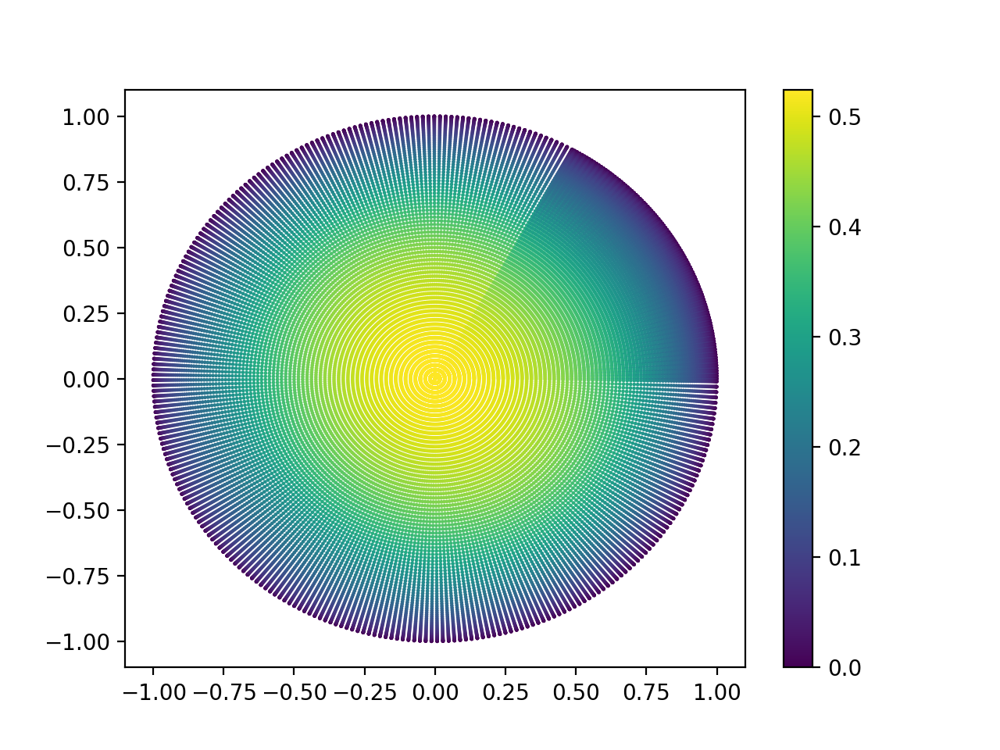

In [371]:
%matplotlib notebook
ratio = 43.817/37.426
x = np.cos(phi*np.pi/180*ratio)*np.sin(theta*np.pi/180)
y = np.sin(phi*np.pi/180*ratio)*np.sin(theta*np.pi/180)
sc = plt.scatter(x,y,c = gain[0].T, s = 0.5)
plt.colorbar(sc)

<IPython.core.display.Javascript object>


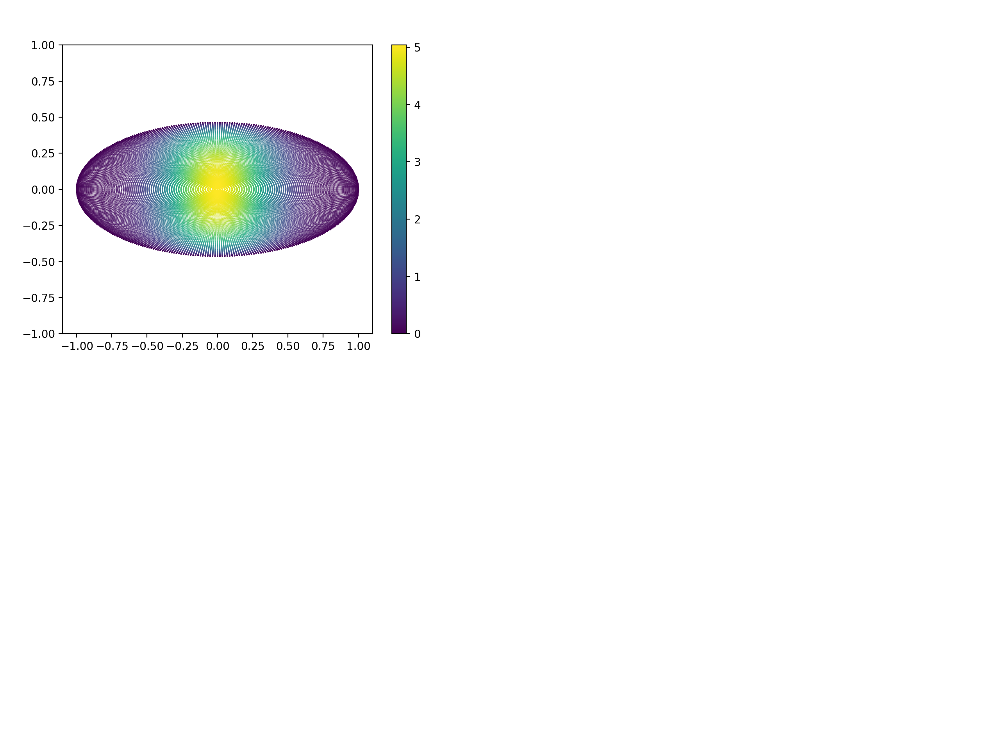

In [387]:
%matplotlib notebook
ratio = 0.6337/0.2934

x = np.cos(phi*np.pi/180)*np.sin(theta*np.pi/180)
y = np.sin(phi*np.pi/180)*np.sin(theta*np.pi/180)/ratio
sc = plt.scatter(x.flatten(),y.flatten(),c = gain[99].T.flatten(), s = 0.08)
#plt.xlim(np.min(y),np.max(y))
plt.ylim(-1,1)
plt.colorbar(sc)

In [388]:
np.sqrt(8*np.log(2))

2.3548200450309493

In [326]:
def Gaussian2D(A, sigx, sigy):
    return A * np.exp(-(theta*np.pi/180*np.cos(phi*np.pi/180))**2/2/sigx**2 - (theta*np.pi/180*np.sin(phi*np.pi/180))**2/2/sigy**2) 


<IPython.core.display.Javascript object>


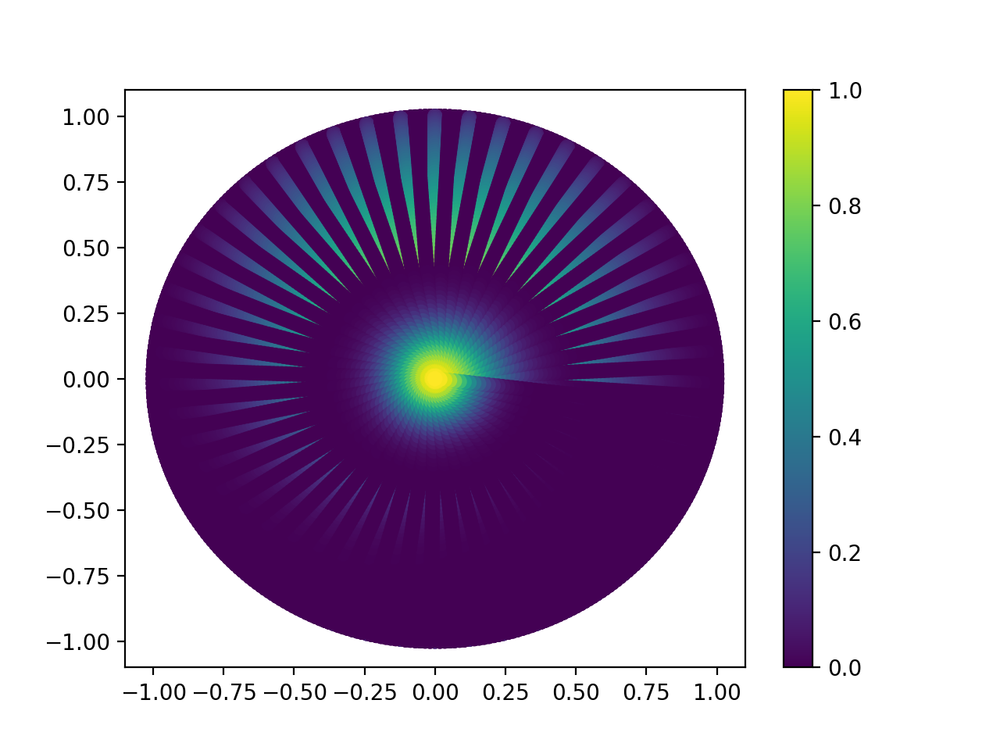

In [347]:
%matplotlib notebook
x = np.cos(phi*np.pi/180*7)*np.sin(theta*np.pi/180)
y = np.sin(phi*np.pi/180*7)*np.sin(theta*np.pi/180)
sc = plt.scatter(x,y,c = Gaussian2D(1,0.1,0.7))
plt.colorbar(sc)

In [ ]:
x = np.cos(phi*np.pi/180*7)*np.sin(theta*np.pi/180)
y = np.sin(phi*np.pi/180*7)*np.sin(theta*np.pi/180)
sc = plt.scatter(x,y,c = Gaussian2D(1,0.1,0.7))
plt.colorbar(sc)

In [297]:
theta

array([[90., 89., 88., ...,  2.,  1.,  0.],
       [90., 89., 88., ...,  2.,  1.,  0.],
       [90., 89., 88., ...,  2.,  1.,  0.],
       ...,
       [90., 89., 88., ...,  2.,  1.,  0.],
       [90., 89., 88., ...,  2.,  1.,  0.],
       [90., 89., 88., ...,  2.,  1.,  0.]])

In [278]:
np.min(gain[0])

1.0000230261160341e-100

In [248]:
np.max(gain[0])

0.5236366068718123

In [226]:
newphi = np.arctan(yy/xx)
newtheta = xx/np.cos(yy/xx)

<ipython-input-226-ed4e127ff515>:1: RuntimeWarning: divide by zero encountered in true_divide
  newphi = np.arctan(yy/xx)
<ipython-input-226-ed4e127ff515>:1: RuntimeWarning: invalid value encountered in true_divide
  newphi = np.arctan(yy/xx)
<ipython-input-226-ed4e127ff515>:2: RuntimeWarning: divide by zero encountered in true_divide
  newtheta = xx/np.cos(yy/xx)
<ipython-input-226-ed4e127ff515>:2: RuntimeWarning: invalid value encountered in true_divide
  newtheta = xx/np.cos(yy/xx)
<ipython-input-226-ed4e127ff515>:2: RuntimeWarning: invalid value encountered in cos
  newtheta = xx/np.cos(yy/xx)


array([[ 9.00000000e+01,  8.90000000e+01,  8.80000000e+01, ...,
         2.00000000e+00,  1.00000000e+00,             nan],
       [ 9.00076155e+01,  8.90077010e+01,  8.80077886e+01, ...,
         2.39951669e+00,  2.56773394e+00,             nan],
       [ 9.00304683e+01,  8.90308109e+01,  8.80311612e+01, ...,
         5.13546789e+00, -1.43542082e+00,             nan],
       ...,
       [-1.31758777e+03, -5.50093566e+03,  2.36701210e+03, ...,
        -3.06036352e+01, -1.00861528e+00,             nan],
       [-1.62680602e+03, -2.94203255e+04,  1.74364722e+03, ...,
        -3.30137994e+00, -3.75946802e+00,             nan],
       [-2.12613898e+03,  8.78634830e+03,  1.38036522e+03, ...,
        -2.11745422e+00,  1.27506204e+00,             nan]])

In [ ]:
import seaborn as sns


In [200]:
gain[0][12].shape

(360,)

[29.30330574 29.68475728 29.3835201  28.1007097  31.800068   29.35701361
 25.23124183 24.42095016 29.27928669 29.47961    25.31969987 26.07392105
 31.71885051 29.25056388 27.19744933 29.32531426 27.60607287 31.35867233
 29.65792369 28.6019513  28.86390922 26.5712685  27.88915455 30.19909575
 29.49390254 25.65827583 24.44851293 24.85512963 24.20892848 27.32544516
 26.08269632 26.26672361 31.75625875 23.9984925  26.4943768  30.04759288
 31.75607534 27.34888645 26.02778995 28.10677133 23.43147359 26.50043326
 31.15673281 24.44916388 29.69259021 28.69676746 25.91762016 31.30138879
 25.13503795 30.41551014 29.75546426 24.02406007 30.60825121 31.31538916
 24.98753113 31.39748488 27.40098869 27.27246776 23.80250725 25.0695336
 29.44343669 27.46513546 29.89840441 31.0711759  29.95000716 31.34456859
 28.53186825 28.48157392 29.16216379 25.25911671 30.54053873 24.06754055
 30.17511268 31.54103841 24.33256589 31.16184786 30.09535993 29.91565257
 28.38646835 26.97931056 29.50734218 26.74956425 25.

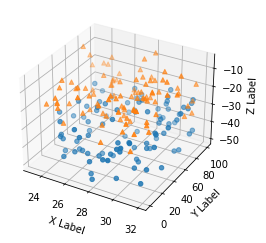

In [177]:
import matplotlib.pyplot as plt
import numpy as np

# Fixing random state for reproducibility
np.random.seed(19680801)


def randrange(n, vmin, vmax):
    """
    Helper function to make an array of random numbers having shape (n, )
    with each number distributed Uniform(vmin, vmax).
    """
    return (vmax - vmin)*np.random.rand(n) + vmin

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

n = 100

# For each set of style and range settings, plot n random points in the box
# defined by x in [23, 32], y in [0, 100], z in [zlow, zhigh].
for m, zlow, zhigh in [('o', -50, -25), ('^', -30, -5)]:
    xs = randrange(n, 23, 32)
    ys = randrange(n, 0, 100)
    zs = randrange(n, zlow, zhigh)
    ax.scatter(xs, ys, zs, marker=m)
    print(xs)

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()

In [262]:
import matplotlib
matplotlib.__version__

'3.3.4'

In [267]:
theta

array([[90., 89., 88., ...,  2.,  1.,  0.],
       [90., 89., 88., ...,  2.,  1.,  0.],
       [90., 89., 88., ...,  2.,  1.,  0.],
       ...,
       [90., 89., 88., ...,  2.,  1.,  0.],
       [90., 89., 88., ...,  2.,  1.,  0.],
       [90., 89., 88., ...,  2.,  1.,  0.]])

In [268]:
phi

array([[  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  1.,   1.,   1., ...,   1.,   1.,   1.],
       [  2.,   2.,   2., ...,   2.,   2.,   2.],
       ...,
       [357., 357., 357., ..., 357., 357., 357.],
       [358., 358., 358., ..., 358., 358., 358.],
       [359., 359., 359., ..., 359., 359., 359.]])

In [273]:
yy

array([[  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  1.17076364,   1.17076364,   1.17076364, ...,   1.17076364,
          1.17076364,   1.17076364],
       [  2.34152728,   2.34152728,   2.34152728, ...,   2.34152728,
          2.34152728,   2.34152728],
       ...,
       [417.96261957, 417.96261957, 417.96261957, ..., 417.96261957,
        417.96261957, 417.96261957],
       [419.13338321, 419.13338321, 419.13338321, ..., 419.13338321,
        419.13338321, 419.13338321],
       [420.30414685, 420.30414685, 420.30414685, ..., 420.30414685,
        420.30414685, 420.30414685]])